In [1]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd
import numpy as np
from datetime import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
import seaborn as sns
import plotly.figure_factory as ff
from keras.models import Sequential
from keras.layers import LSTM,Dropout,Dense


from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)


In [2]:
df = pd.read_pickle('/kaggle/input/bse-stocks-data-15-minute-interval-historical/SIEMENS-15minute-Hist')
df = pd.DataFrame(df)
df['date'] = df['date'].apply(pd.to_datetime)
df.set_index('date',inplace=True)


In [3]:
fig = go.Figure(data=[go.Table(
    header=dict(values=list(['date','open','high','low','close','volume']),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[df.index,df.open, df.high, df.low, df.close,df.volume],
               fill_color='lavender',
               align='left'))
])

fig.show()

In [4]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.graph_objs import Line

fig = make_subplots(rows=4, cols=1,subplot_titles=('Open','High','Low','Close'))

fig.add_trace(
    Line(x=df.index, y=df.open),
    row=1, col=1
)

fig.add_trace(
    Line(x=df.index, y=df.high),
    row=2, col=1
)

fig.add_trace(
    Line(x=df.index, y=df.low),
    row=3, col=1
)

fig.add_trace(
    go.Line(x=df.index, y=df.close),
    row=4, col=1
)

fig.update_layout(height=1400, width=1000, title_text="OHLC Line Plots")

fig.show()


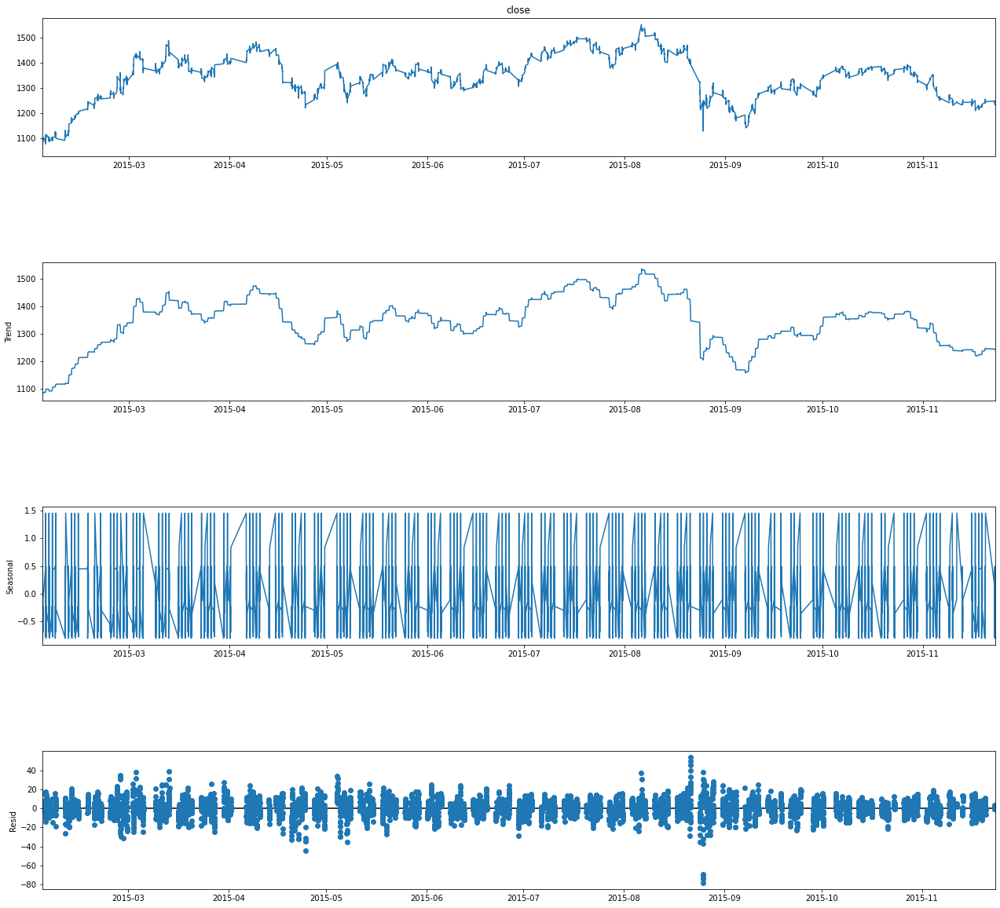

In [5]:
#only first 5000 values are taken because it was looking very crowded
result = seasonal_decompose(df.close.head(5000), model='additive', period = 30)
fig = go.Figure()  
fig = result.plot()  
fig.set_size_inches(20, 19)

In [6]:
open_data = [33.0, 33.3, 33.5, 33.0, 34.1]
high_data = [33.1, 33.3, 33.6, 33.2, 34.8]
low_data = [32.7, 32.7, 32.8, 32.6, 32.8]
close_data = [33.0, 32.9, 33.3, 33.1, 33.1]
dates = [datetime(year=2013, month=10, day=10),
         datetime(year=2013, month=11, day=10),
         datetime(year=2013, month=12, day=10),
         datetime(year=2014, month=1, day=10),
         datetime(year=2014, month=2, day=10)]

fig = go.Figure(data=[go.Candlestick(x=dates,
                       open=open_data, high=high_data,
                       low=low_data, close=close_data,
               increasing_line_color= 'green', decreasing_line_color= 'red')])

fig.show()

In [7]:
import plotly.graph_objects as go

import pandas as pd
from datetime import datetime


fig = go.Figure(data=[go.Candlestick(x=df.index,
                open=df['open'],
                high=df['high'],
                low=df['low'],
                close=df['close'])])

fig.show()

In [8]:
new_df = pd.DataFrame()
new_df = df['close']
new_df.index = df.index

In [9]:
scaler=MinMaxScaler(feature_range=(0,1))
final_dataset=new_df.values

train_data=final_dataset[0:20000,]
valid_data=final_dataset[20000:,]




In [10]:
train_df = pd.DataFrame()
valid_df = pd.DataFrame()
train_df['Close'] = train_data
train_df.index = new_df[0:20000].index
valid_df['Close'] = valid_data
valid_df.index = new_df[20000:].index


In [11]:
scaler=MinMaxScaler(feature_range=(0,1))
scaled_data=scaler.fit_transform(final_dataset.reshape(-1,1))

x_train_data,y_train_data=[],[]

for i in range(60,len(train_data)):
    x_train_data.append(scaled_data[i-60:i,0])
    y_train_data.append(scaled_data[i,0])
    
x_train_data,y_train_data=np.array(x_train_data),np.array(y_train_data)

x_train_data=np.reshape(x_train_data,(x_train_data.shape[0],x_train_data.shape[1],1))

In [12]:
lstm_model=Sequential()
lstm_model.add(LSTM(units=50,return_sequences=True,input_shape=(x_train_data.shape[1],1)))
lstm_model.add(LSTM(units=50))
lstm_model.add(Dense(1))

inputs_data=new_df[len(new_df)-len(valid_data)-60:].values
inputs_data=inputs_data.reshape(-1,1)
inputs_data=scaler.transform(inputs_data)

lstm_model.compile(loss='mean_squared_error',optimizer='adam')
lstm_model.fit(x_train_data,y_train_data,epochs=1,batch_size=1,verbose=2)

lstm_model.summary()

19940/19940 - 466s - loss: 2.8257e-04
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 60, 50)            10400     
_________________________________________________________________
lstm_1 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense (Dense)                (None, 1)                 51        
Total params: 30,651
Trainable params: 30,651
Non-trainable params: 0
_________________________________________________________________


In [13]:
X_test=[]
for i in range(60,inputs_data.shape[0]):
    X_test.append(inputs_data[i-60:i,0])
X_test=np.array(X_test)

X_test=np.reshape(X_test,(X_test.shape[0],X_test.shape[1],1))
predicted_closing_price=lstm_model.predict(X_test)
predicted_closing_price=scaler.inverse_transform(predicted_closing_price)

In [14]:
valid_df['Predictions']=predicted_closing_price

In [15]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_df.index,y=train_df['Close'],
                    mode='lines',
                    name='Siemens Train Data'))
fig.add_trace(go.Scatter(x=valid_df.index,y=valid_df['Close'],
                    mode='lines',
                    name='Siemens Valid Data'))
fig.add_trace(go.Scatter(x=valid_df.index,y=valid_df['Predictions'],
                    mode='lines',
                    name='Prediction'))

In [16]:
from sklearn.metrics import mean_squared_error
print('The Mean Squared Error is',mean_squared_error(valid_df['Close'].values,valid_df['Predictions'].values))

The Mean Squared Error is 63.480835873473694


In [17]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=valid_df.index,y=valid_df['Close'],
                    mode='lines',
                    name='Test'))
fig.add_trace(go.Scatter(x=valid_df.index,y=valid_df['Predictions'],
                    mode='lines',
                    name='Predicted'))

In [18]:
!pip install see_rnn


You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [19]:
from see_rnn import *

In [20]:
grads1 = get_gradients(lstm_model, 1, x_train_data, y_train_data)
grads2 = get_gradients(lstm_model,2,x_train_data,y_train_data)
output = get_outputs(lstm_model, 1, x_train_data)

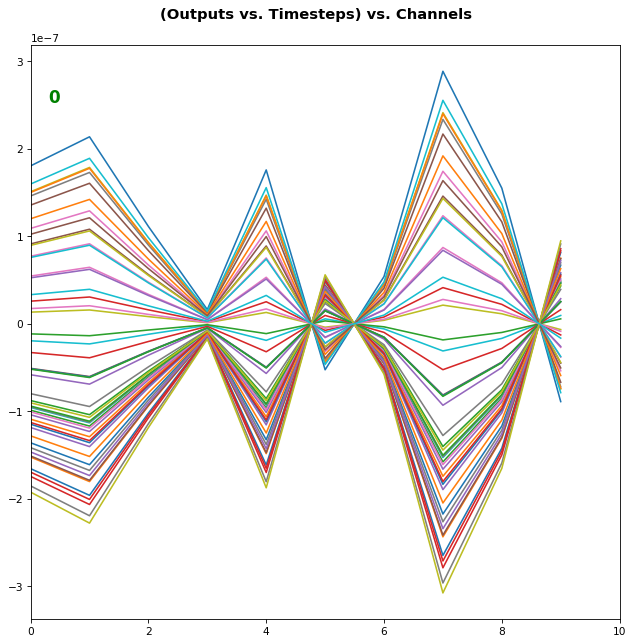

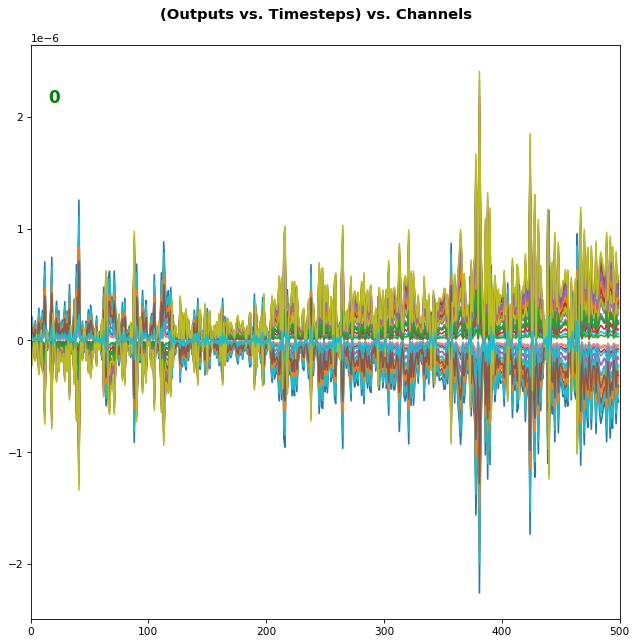

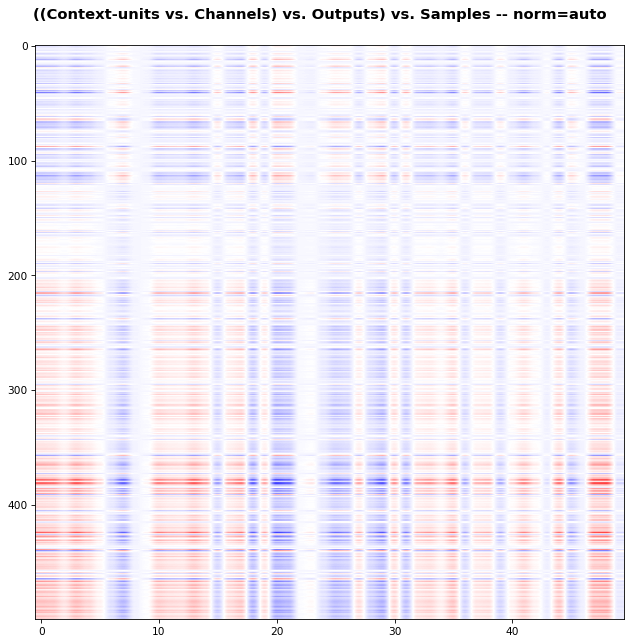

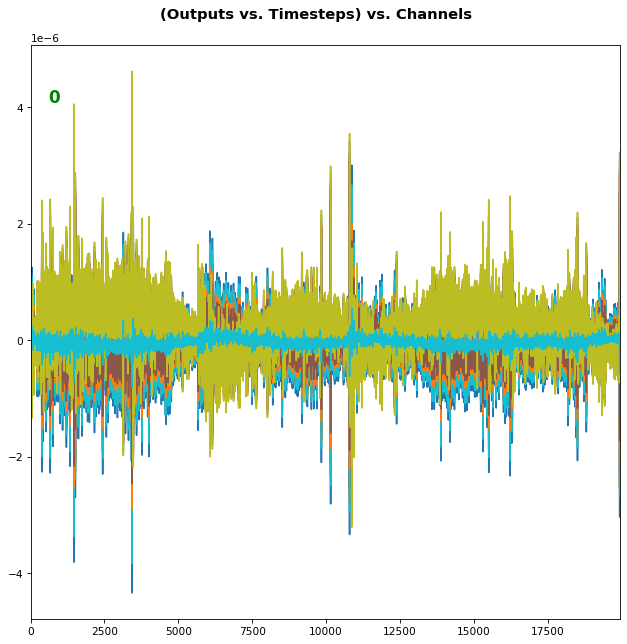

(<Figure size 760x760 with 1 Axes>,
 array(<matplotlib.axes._subplots.AxesSubplot object at 0x7f4790748490>,
       dtype=object))

In [21]:
features_1D(grads1[:10] ,n_rows=2)
features_1D(grads1[:500] ,n_rows=2)
features_2D(grads1[:500])
features_1D(grads1 ,n_rows=2)


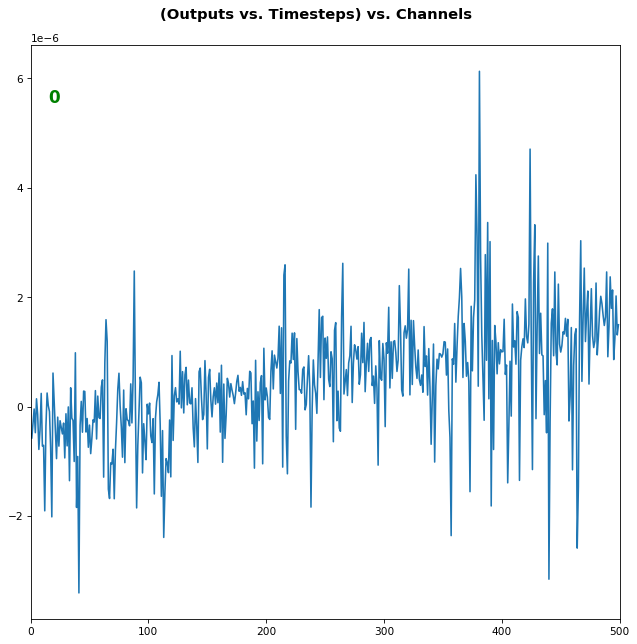

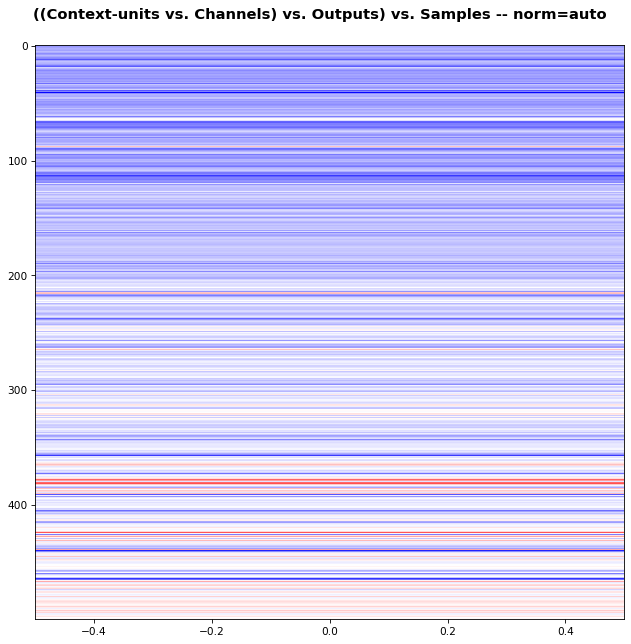

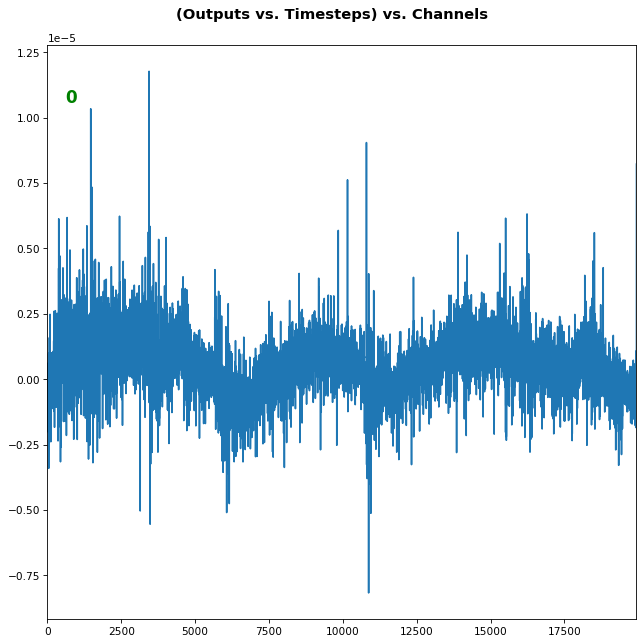

(<Figure size 760x760 with 1 Axes>,
 array(<matplotlib.axes._subplots.AxesSubplot object at 0x7f47a36a1110>,
       dtype=object))

In [22]:
features_1D(grads2[:500], n_rows=2)
features_2D(grads2[:500], n_rows=2)
features_1D(grads2, n_rows=2)

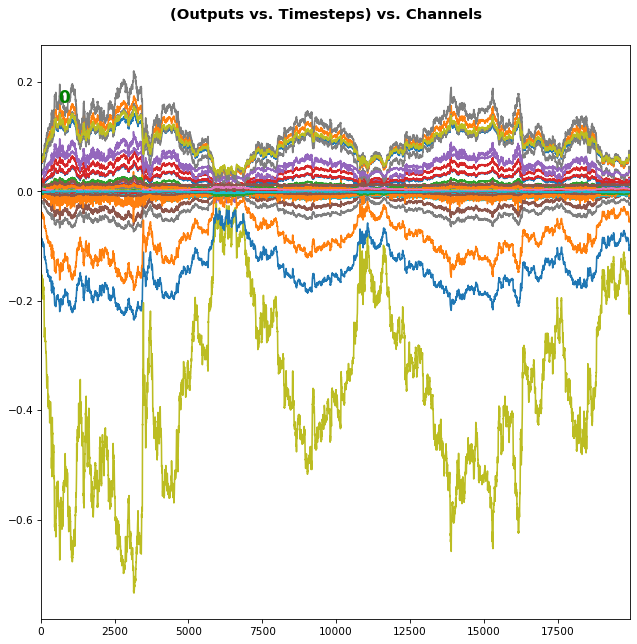

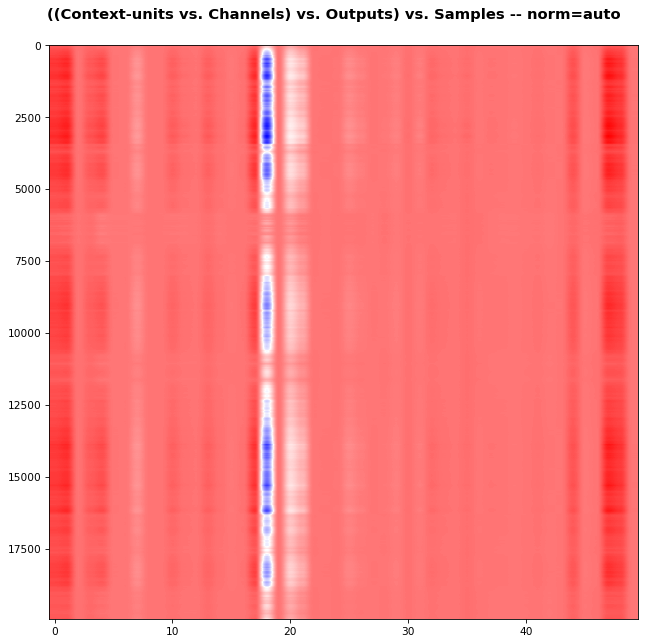

(<Figure size 760x760 with 1 Axes>,
 array(<matplotlib.axes._subplots.AxesSubplot object at 0x7f47a34e2b50>,
       dtype=object))

In [23]:
features_1D(output, n_rows=2)
features_2D(output, n_rows=2)


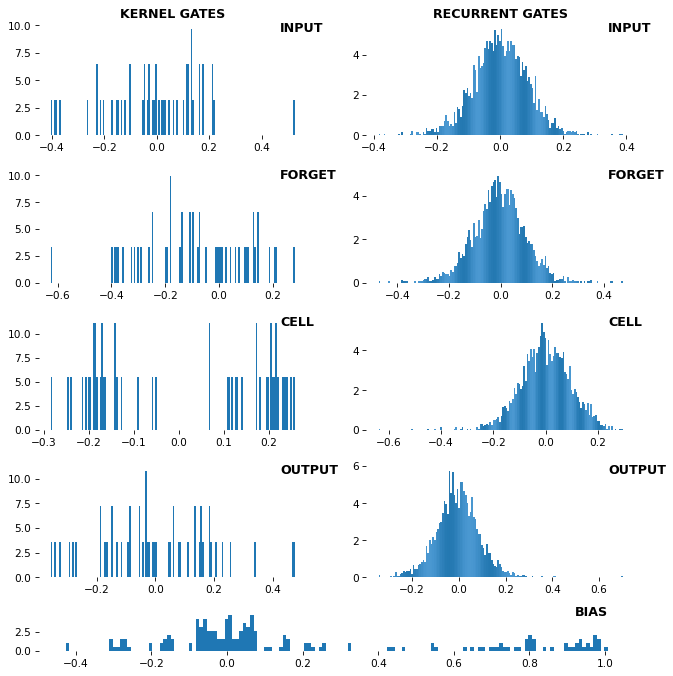

([<Figure size 684x684 with 9 Axes>],
 [array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f47a31bb750>,
        dtype=object)])

In [24]:
rnn_histogram(lstm_model, 'lstm', equate_axes=False)

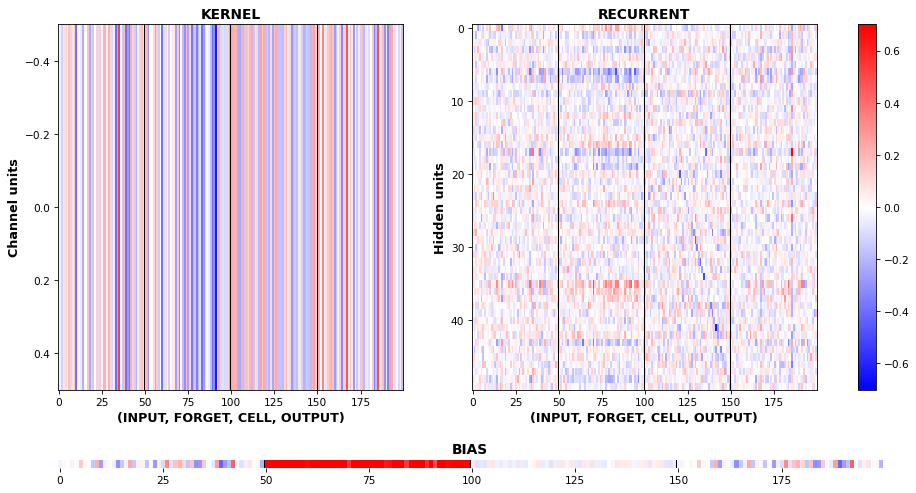

([<Figure size 1064x608 with 4 Axes>],
 [array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f477031e290>,
        dtype=object)])

In [25]:
rnn_heatmap(lstm_model, 'lstm')